<font size="+4">Исследование рынка заведений общественного питания Москвы</font>

[<font size="+2">I часть исследования. Исследование рынка заведений общественного питания Москвы</font>](#part_I)

Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.

<font size="+2">Цель исследования</font>
-  Найти интересные особенности рынка заведений общественного питания Москвы, которые в будущем помогут в выборе подходящего инвесторам места.

<font size="+2">Задачи исследования</font>
- Подготовить исследование рынка Москвы;
- Найти интересные особенности;
- Построить визуализации;
- Презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.

<font size="+2">Данные для исследования</font>  
Датасет для исследования содержит заведения общественного питания Москвы, который составлен на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер.

[<font size="+2">II часть исследования. Исследование рынка кофеен Москвы</font>](#part_II)

Основателям фонда «Shut Up and Take My Money» не даёт покоя успех сериала «Друзья». Их мечта — открыть такую же крутую и доступную, как «Central Perk», кофейню в Москве. Будем считать, что заказчики не боятся конкуренции в этой сфере, ведь кофеен в больших городах уже достаточно. Необходимо определить, осуществима ли мечта клиентов.

<font size="+2">Цель исследования</font>
- Разработать рекомендации для открытия кофейни в Москве.

<font size="+2">Задачи исследования</font>
- Ответить на вопросы инвесторов:
    - Сколько всего кофеен в датасете? В каких округах их больше всего, каковы особенности их расположения?
    - Есть ли круглосуточные кофейни?
    - Какие у кофеен рейтинги? Как они распределяются по округам?
    - На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?
- Построить визуализации;
- Дать обоснованные рекомендации для открытия нового заведения;
- Предоставить рекомендации в виде текста с описанием или маркерами на географической карте.

<font size="+2">Данные для исследования</font>  
Те же, что и для I части.

<font size="+2">Содержание</font><a id='content'></a>
1. [Обзор данных](#start)
2. [Предобработка данных](#prepare)
3. [Исследовательский анализ данных](#eda)  
4. [Детализация исследования для открытия кофейни](#eda_cafe)
5. [Итоговые выводы исследования](#conclusion)


<font size="+1">Презентация подготовленная по результатам исследования: https://disk.yandex.ru/i/CNmYuwYTQV6iaw</font>  

<font size="+3">Часть I. Исследование рынка заведений общественного питания Москвы</font> <a id='part_I'></a>

# Обзор данных <a id='start'></a>
Загрузим файл, где содержатся данные заведений общественного питания Москвы.

In [1]:
# установка библиотеки folium для визуализации географической карты

!pip install folium

In [2]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import json
import seaborn as sns
import folium
from folium import Map, Choropleth, Marker
from folium.plugins import MarkerCluster

In [3]:
# Настройка для отображения полных строк

pd.options.display.max_colwidth = 1

In [4]:
# чтение датасета через try except. Сначала предпринимается попытка прочитать датасет с локального расположения.
# В случае неудачи происходит загрузка датасета по url

try:
    df = pd.read_csv('local_dataset.csv')
except:
    df = pd.read_csv('url_to_dataset.csv')

In [5]:
df.head(5)  # Вывод первых 5 строк для первичного ознакомления с датасетом

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [6]:
df.tail(5)  # Вывод последних 5 строк для первичного ознакомления с датасетом

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
8401,Суши Мания,кафе,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0
8402,Миславнес,кафе,"Москва, Пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150.0
8403,Самовар,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0
8404,Чайхана Sabr,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0
8405,Kebab Time,кафе,"Москва, Россошанский проезд, 6",Южный административный округ,"ежедневно, круглосуточно",55.598229,37.604702,3.9,NaN,NaN,NaN,NaN,0,12.0


Судя по первым и последним 5 записям датасета df, данные соотносятся с целями анализа. Данных для анализа достаточно.

In [7]:
df.shape

(8406, 14)

В датасете представлено 8406 заведений общественного питания Москвы.

## Описание столбцов

- `name` — название заведения;
- `address` — адрес заведения;
- `category` — категория заведения, например «кафе», «пиццерия» или «кофейня»;
- `hours` — информация о днях и часах работы;
- `lat` — широта географической точки, в которой находится заведение;
- `lng` — долгота географической точки, в которой находится заведение;
- `rating` — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
- `price` — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
- `avg_bill` — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
    - «Средний счёт: 1000–1500 ₽»;
    - «Цена чашки капучино: 130–220 ₽»;
    - «Цена бокала пива: 400–600 ₽».
- `middle_avg_bill` — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:
    - Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
    - Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
    - Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.
- `middle_coffee_cup` — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:
    - Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
    - Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
    - Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.
- `chain` — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
    - 0 — заведение не является сетевым
    - 1 — заведение является сетевым
- `district` — административный округ, в котором находится заведение, например Центральный административный округ;
- `seats` — количество посадочных мест.

## Типы данных

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


Типы данных в датасете корректны и не нуждаются в преобразовании к иному типу.

**Категориальные данные:**
- `name` — название заведения;
- `category` — категория заведения;
- `address` — адрес заведения;
- `hours` — дни и часы работы;
- `price` — категория цен в заведении;
- `avg_bill` — средняя стоимость заказа;
- `chain` — признак сетевого заведения;
- `district` — округ заведения.

**Количественные данные:**
- `lat` — широта;
- `lng` — долгота;
- `rating` — рейтинг заведения;
- `middle_avg_bill` — средний чек;
- `middle_coffee_cup` — цена одной чашки капучино;
- `seats` — количество посадочных мест.

## Общая гистограмма

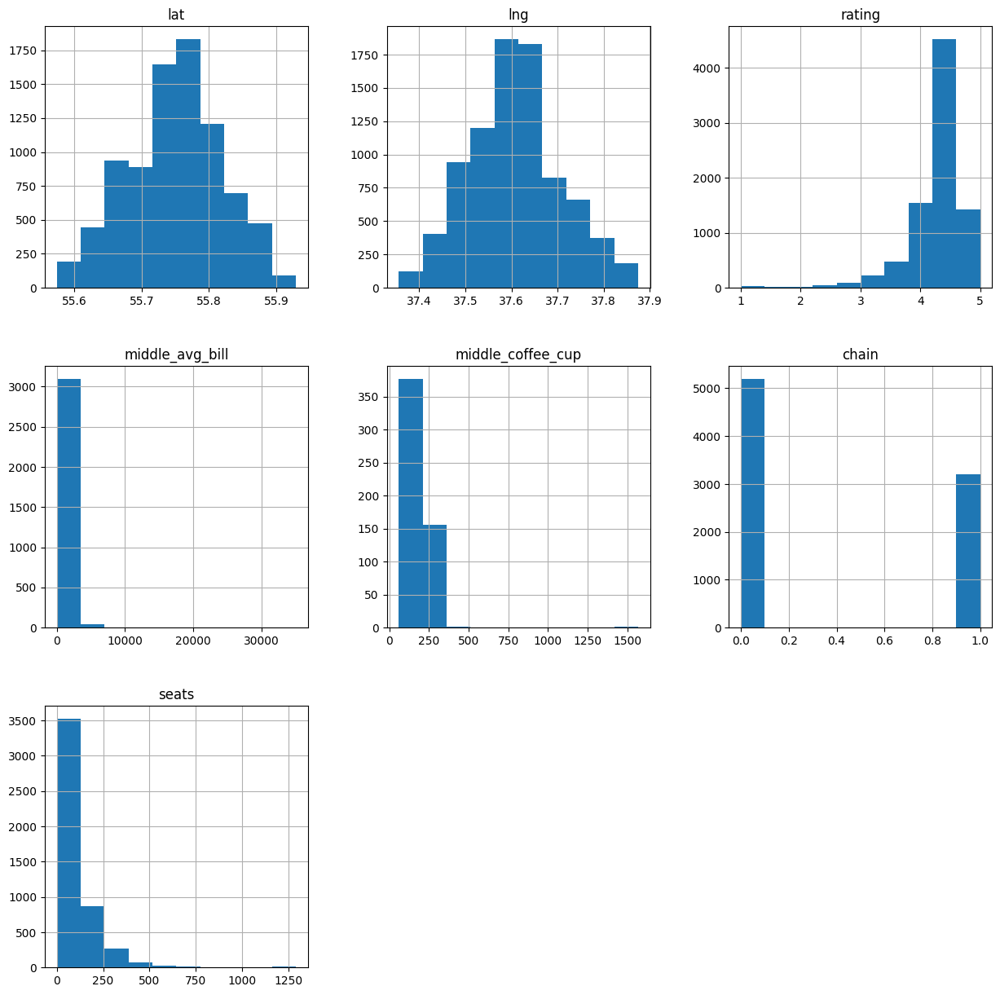

In [9]:
# Построение общей гистограммы для первичного ознакомления с датасетом

df.hist(figsize=(15, 15));

Согласно общей гистограмме можно сложить следующее первое представление:
- Широта и долгота характеризуются нормальным распределением без выбросов;
- Рейтинг большинства завдений равен 4 и более, с пиком в районе 4.5;
- Средний счёт в большинстве случаев меньше 5000, однако есть и выбросы до нескольких десятков тысяч;
- Цена одной чашки капучино в большистве случаев меньше 250 рублей;
- НЕсетевых заведений больше, чем сетевых;
- Подавляющее число заведений имеет менее 125 посадочных мест.

# Предобработка данных <a id='prepare'></a>

## Дубликаты

### Явные дубликаты

In [10]:
df.duplicated().sum()

0

Явных дубликатов не обнаружено

In [11]:
df[['name', 'address']].duplicated().sum()

0

Дубликатов по сочетанию названия и адреса также не обнаружено.

### Неявные дубликаты

In [12]:
df['name'].duplicated().sum()

2792

Существует 2792 дубликата по названию заведений. 

In [13]:
df['name'] = df['name'].str.lower()
df['name'].duplicated().sum()

2894

После того как названия заведений были приведены к нижнему регистру, кол-во дубликатов по названию возросло на 102, до 2894 единиц. Что является нормальным, т.к. в датасете присутствует множество сетевых заведений.

In [14]:
df['address'].duplicated().sum()

2653

Существует 2653 дубликата по адресу заведений. 

In [15]:
df['address'] = df['address'].str.lower()
df['address'].duplicated().sum()

2654

После того как адреса заведений были приведены к нижнему регистру, кол-во дубликатов по названию возросло на 1 единицу, до 2654. Что является нормальным, т.к. в датасете могли завести один и тот же адрес, но использовать разный регистр.

In [16]:
df[['name', 'address']].duplicated().sum()

4

Найдено 4 дубликата по сочетанию названия и адреса заведения.

In [17]:
df = df.drop_duplicates(subset=['name', 'address'])
df[['name', 'address']].duplicated().sum()

0

Дубликаты успешно удалены.

### Обработка названий

Названия отдельных заведений являющиеся сетевыми могли быть написаны по-разному. Чтобы проверить это, стоит попробовать найти среди названий заведений такие, которые являются по сути одинаковыми, но отличаются на 1 или несколько символов в следствии опечатки. Рассмотрим 30 наиболее часто встречающихся названий.

In [18]:
df['name'].value_counts().sort_values(ascending=False).head(30)

кафе                                   188
шоколадница                            120
домино'с пицца                         77 
додо пицца                             74 
one price coffee                       72 
яндекс лавка                           69 
cofix                                  65 
prime                                  50 
хинкальная                             44 
шаурма                                 43 
кофепорт                               42 
кулинарная лавка братьев караваевых    39 
теремок                                38 
чайхана                                37 
ресторан                               34 
cofefest                               32 
буханка                                32 
столовая                               28 
му-му                                  27 
drive café                             24 
кофемания                              23 
андерсон                               22 
крошка картошка                        22 
cinnabon   

In [19]:
display(df[df['name'].str.contains('домино')]['name'].unique())
display(df[df['name'].str.contains('яндекс')]['name'].unique())
display(df[df['name'].str.contains('drive caf')]['name'].unique())

array(["домино'с пицца", 'доминос пицца', "домино'с"], dtype=object)

array(['яндекс лавка', 'яндекс.лавка', 'яндекс еда'], dtype=object)

array(['drive café', 'drive cafe'], dtype=object)

При ручной проверке нашлось несколько названий, которые следует объединить в одно, т.к. это заведения одной сети написанные немного по-разному:
- `домино'с пицца`, `доминос пицца`, `домино'с` ---> `домино'с пицца`;
- `яндекс лавка`, `яндекс.лавка` ---> `яндекс лавка`;
- `drive café`, `drive cafe` ---> `drive café`.

In [20]:
df['name'] = df['name'].replace("домино'с", "домино'с пицца")
df['name'] = df['name'].replace("доминос пицца", "домино'с пицца")
df['name'] = df['name'].replace("яндекс.лавка", "яндекс лавка")
df['name'] = df['name'].replace("drive cafe", "drive café")

display(df[df['name'].str.contains('домино')]['name'].unique())
display(df[df['name'].str.contains('яндекс')]['name'].unique())
display(df[df['name'].str.contains('drive caf')]['name'].unique())

array(["домино'с пицца"], dtype=object)

array(['яндекс лавка', 'яндекс еда'], dtype=object)

array(['drive café'], dtype=object)

Заведения `домино'с пицца`, `яндекс лавка` и `drive café` успешно приведены к одному корректному наименованию.

In [21]:
display(df[df['name'].str.contains('чайха')]['name'].unique())
display(df[df['name'].str.contains('чайхо')]['name'].unique())

array(['чайхана беш-бармак', 'чайхана омад', 'чайхана', 'чайхана ташкент',
       'чайхана найман', 'чайхана самарканд', 'чайхана москва-ташкент',
       'чайхана ором +24', 'чайхана баракат', 'чайхана 24',
       'чайхана кумыс', 'чайхана халал', 'чайхана халаль',
       'чайхана хизмат', 'чайхана райан', 'чайхана регар',
       'чайхана элина', 'чайхана у самвела', 'чайхана. uz',
       'чайхана халяль', 'чайхана адияхан', 'чайхана манас',
       'чайхана зам-зам', 'чайхана дегунино', 'чайхана исфисор',
       'чайхана навои халяль', 'чайхана долина', 'чайхана очаг',
       'чайхана пловная', 'чайхана кенч', 'zeчайхана', 'чайхана инжир',
       'чайхана халаль 24', 'чайхана вкус самарканда', 'чайхана 24/7',
       'чайхана. ясин', 'бухара чайхана', 'чайхана vizir', 'чайхана № 83',
       'чайхана космос', 'чайхана24', 'чайхана фрунзе халяль',
       'чайхана doner кафе', 'чайхана этно', 'чайхана рахат',
       'чайхана хан', 'чайхана ош', 'чайхана döner', 'чайхана мускат',
       'ча

array(['чайхона айва', 'чайхона № 1', 'чайхона', 'чайхона №1',
       'доставка еды чайхона исфисор', 'чайхона лаззат',
       'чайхона на соколе', 'чайхона 24', 'чайхона лазиз',
       'чайхона рахмат', 'чайхона ош сити', 'чайхона сармат',
       'чайхона востока 24', 'чайхона самса донер № 1',
       'чайхона азия халяль', 'чайхона нурман', 'чайхона ургут',
       'чайхона бишкек сити', 'чайхона манас', 'чайхона анор',
       'чайхона фаррух', 'чайхона дустон', 'чайхона халва',
       'чайхона райхан', 'чайхона шафран', 'чайхона востока'],
      dtype=object)

Найдены также заведений типа "чайхана", у которых отличается лишь одна буква, например `чайхана-халва`, `чайхана халва`, `чайхона халва`. Наименования таких заведений исправлятся не будут, т.к. нет уверенности, что это одни и те же заведения (они могут принадлежать разным юр лицам). Уточнить данную информацию можно, если бы датасет содержал данные о юр лицах заведений.

Дубликаты по сочетанию названия и адреса заведения исключены из датасета.

## Аномальные и выбивающиеся значения

### Новая категория заведения Доставка

В датасете среди заведений общественного питания присутствуют также заведения ориентированные только на доставку и не имеющие зала с посадочными местами. Такие заведения будут определены в отдельную категорию `доставка`.

In [22]:
df.loc[(df.name.str.contains('яндекс')) | (df.name.str.contains('доставк')), 'category'] = 'доставка'

In [23]:
df[df['category'] == 'доставка']['name'].value_counts()

яндекс лавка                    72
яндекс еда                      1 
доставка еды чайхона исфисор    1 
доставка еды и обедов           1 
Name: name, dtype: int64

Для 75 заведений тип изменён на `доставка`.

### seats — количество посадочных мест <a id='preprocessing_seats'></a>

В данном разделе будут изучены и исправлены аномально большие и малые значения количества посадочных мест.

In [24]:
df.loc[df['category'] ==  'доставка', 'seats'].value_counts(dropna=False)

NaN       38
40.0      4 
0.0       4 
45.0      2 
100.0     2 
25.0      2 
200.0     2 
20.0      2 
75.0      2 
250.0     1 
64.0      1 
184.0     1 
90.0      1 
1288.0    1 
24.0      1 
22.0      1 
55.0      1 
350.0     1 
65.0      1 
27.0      1 
280.0     1 
380.0     1 
180.0     1 
124.0     1 
46.0      1 
96.0      1 
Name: seats, dtype: int64

У многих заведений доставки указано количество посадочных мест, вплоть до 1288, что может негативно влиять на сводные показатели. Количество посадочных мест для категории `доставка` будет приведено к `NaN`.

In [25]:
df.loc[df['category'] ==  'доставка', 'seats'] = np.nan
df.loc[df['category'] ==  'доставка', 'seats'].value_counts(dropna=False)

NaN    75
Name: seats, dtype: int64

Количество посадочных мест для заведений категории `доставка` успешно приведено к `NaN`.

Рассмотрим, как распределены заведения по максимально большим показателям количества посадочных мест. И сколько заведений имеет 0 посадочных мест.

In [26]:
df['seats'].value_counts().sort_index(ascending=False).head(15)

1288.0    10
1200.0    1 
1040.0    4 
920.0     2 
760.0     1 
675.0     1 
660.0     2 
650.0     6 
644.0     2 
625.0     23
600.0     1 
585.0     2 
500.0     21
495.0     6 
491.0     2 
Name: seats, dtype: int64

In [27]:
df[df['seats'] == 0]['name'].count()

132

Согласно данным датасета, 132 заведения имеют 0 посадочных мест и несколько десятков заведений содержат более 500. Однако выборочна проверка показывает, что число либо сильно завышено, либо имеет место опечатка. Поэтому для тех заведений, где количество посадочных мест больше или равно значения 1.5% квантиля (500 мест), будут приравнены к медианному значению. При этом будет учитываться категория заведения и исключаться заведения с 500 и более мест.

In [28]:
df['seats'].quantile(0.985)

500.0

In [29]:
for category in df['category'].unique():
    if category == 'доставка':           # не заполняется для категории 'доставка'
        continue
    df.loc[(df['category'] == category) & ((df['seats'] >= df['seats'].quantile(0.985)) | (df['seats'] == 0)), 'seats'] = \
        (df.loc[(df['seats'] < df['seats'].quantile(0.985)) & (df['seats'] != 0)]
           .groupby('category')['seats']
           .agg('mean')
           .round()[category]
        )

In [30]:
df['seats'].value_counts().sort_index(ascending=False).head(5)

495.0    1
481.0    1
480.0    3
478.0    3
455.0    2
Name: seats, dtype: int64

In [31]:
df[df['seats'] == 0]['name'].count()

0

Изменения применены успешно, в датасете не осталось заведений с количеством мест равных 0, а также более или равных 500.

## Пропуски

In [32]:
df.isna().mean().sort_values(ascending=False)

middle_coffee_cup    0.936325
middle_avg_bill      0.625208
price                0.605451
avg_bill             0.545822
seats                0.434063
hours                0.063675
name                 0.000000
category             0.000000
address              0.000000
district             0.000000
lat                  0.000000
lng                  0.000000
rating               0.000000
chain                0.000000
dtype: float64

Пропуски обнаружены в 6 столбцах:
- middle_coffee_cup
- middle_avg_bill 
- price  
- avg_bill
- seats
- hours

### Заполнение пропусков

Для `hours`, `avg_bill` и `price` пропуски будут заполнены значением 'неизвестно'.  
Для `middle_coffee_cup`, `middle_avg_bill` и `seats` пропуски заполнятся не будут, т.к. это количественные переменные и заполнение пропусков может исказить данные.

In [33]:
df['hours'] = df['hours'].fillna('неизвестно')
df['avg_bill'] = df['avg_bill'].fillna('неизвестно')
df['price'] = df['price'].fillna('неизвестно')

df.isna().mean().sort_values(ascending=False)

middle_coffee_cup    0.936325
middle_avg_bill      0.625208
seats                0.434063
name                 0.000000
category             0.000000
address              0.000000
district             0.000000
hours                0.000000
lat                  0.000000
lng                  0.000000
rating               0.000000
price                0.000000
avg_bill             0.000000
chain                0.000000
dtype: float64

Для hours, avg_bill и price пропуски успешно заполнены значением 'неизвестно'.

## Добавление новых столбцов 

### street — названия улиц

Добавим столбец с названиями улиц и назовём его `street`.

In [34]:
def street_name(row):
    street = row['address'].split(', ')[1]
    return street

df['street'] = df.apply(street_name, axis=1)
df['street'].head(5)

0    улица дыбенко          
1    улица дыбенко          
2    клязьминская улица     
3    улица маршала федоренко
4    правобережная улица    
Name: street, dtype: object

Новый столбец `street` добавлен успешно.

### is_24/7 — признак ежедневной круглосуточной работы заведения

Добавим столбец с обозначением, что заведение работает ежедневно и круглосуточно и назовём его `is_24/7`.

In [35]:
df['is_24/7'] = (df['hours'].str.contains('ежедневно')) & (df['hours'].str.contains('круглосуточно'))
df[['hours', 'is_24/7']].head(20)

,hours,is_24/7
0,"ежедневно, 10:00–22:00",False
1,"ежедневно, 10:00–22:00",False
2,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00",False
3,"ежедневно, 09:00–22:00",False
4,"ежедневно, 10:00–22:00",False
5,"ежедневно, 10:00–23:00",False
6,пн 15:00–04:00; вт-вс 15:00–05:00,False
7,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00–22:00",False
8,"ежедневно, 10:00–22:00",False
9,"ежедневно, 12:00–00:00",False


## Итоги предобработки данных

В результате предобработки данных были проведены следующие работы:
- Найдены и устранены неявные дубликаты. Названия нескольких заведений, где из-за опечатки они назывались чуть по-разному, приведены к одному виду. Устранены дубликаты по названию и адресу заведения;
- Устранены аномальные значения:
    - Добавлена новая категория заведений "Доставка" для заведений не имеющих зала;
    - Скорректированы аномальные значения кол-ва посадочных мест для заведений, где их число было завышено.
- Для столбцов `hours`, `avg_bill` и `price` пропуски заполнены значением 'неизвестно';
- Добавлены новые столбцы:
    - `street` с названиями улиц;
    - `is_24/7` признак того, что заведение работает ежедневно и круглосуточно.

# Исследовательский анализ данных <a id='eda'></a>

## Категории заведений

In [36]:
def add_percent(result):
    '''
    Функция добавляет столбец с процентным соотношением на основании второго столбца датафрейма.
    '''
    result['percent'] = round(result.iloc[:,[1]] / result.iloc[:,[1]].sum() * 100, 1).astype('str') + '%'
    return result

categories = (df.groupby('category')['name']
                .agg(['count'])
                .reset_index()
                .sort_values(by='count', ascending=False))

add_percent(categories)

,category,count,percent
4,кафе,2376,28.3%
7,ресторан,1969,23.4%
5,кофейня,1413,16.8%
0,"бар,паб",764,9.1%
6,пиццерия,633,7.5%
2,быстрое питание,601,7.2%
8,столовая,315,3.7%
1,булочная,256,3.0%
3,доставка,75,0.9%


In [37]:
fig = px.bar(categories,
             x='category',
             y='count',
             title='Распределение заведений общественного питания Москвы',
             labels={'count':'Количество', 'category': ''},
             text="percent",
             height=500,
             width=900)
fig.update_xaxes(tickangle=315)
fig.show()

Более 50% заведений общественного питания Москвы являются `кафе` (28.3%) или `рестораном` (24.3%). На третьем по популярности месте стоят `кофейни` с 16.8%. Прочие категории заведений занимают менее 10% рынка, при этом самые редкие категории это `столовая`, `булочная` и `доставка` с 3.7%, 3% и 0.9% соответственно.

## Количество посадочных мест в заведениях различных категорий

Для анализа количества посадочных мест в заведениях различных категорий, сгруппируем данные по категории, найдём среднее и медиану. Полученный результат сохраним в датафрейм `categories_seats`.

In [38]:
categories_seats = (df[df['category'] != 'доставка'].groupby('category')['seats']
                                                    .agg(['mean','median'])
                                                    .reset_index()
                                                    .sort_values(by='mean', ascending=False))
categories_seats['mean'] = categories_seats['mean'].round()
categories_seats

,category,mean,median
6,ресторан,111.0,90.0
4,кофейня,100.0,85.0
0,"бар,паб",98.0,85.0
2,быстрое питание,94.0,76.0
3,кафе,90.0,70.0
1,булочная,90.0,76.0
7,столовая,87.0,80.0
5,пиццерия,83.0,60.0


Визуализируем полученные в `categories_seats` данные.

In [39]:
x = categories_seats['category']
y_mean = categories_seats['mean']
y_median = categories_seats['median']

fig = go.Figure(data=[go.Bar(name='Среднее', x=x, y=y_mean, text=y_mean),
                      go.Bar(name='Медиана', x=x, y=y_median, text=y_median)],
                layout=go.Layout(height=500, width=900, title='Средняя и медиана количества мест в заведениях различных категорий'))

fig.update_layout(legend_title_text = 'Величина', yaxis_title='Количество мест')

fig.update_xaxes(tickangle=315)
fig.show()

Ни одна из категорий не является абсолютным фаворитом или аутсайдером по количеству посадочных мест.  
Наибольшим количеством посадочных мест характеризуются `рестораны`, `кофейни` и `бары ,пабы`.  
Наименьшее количество посадочных мест у `пиццерии`.  
Среди заведений различных категорий наибольший разрыв между средним и медианой показывают `кафе` и `пиццерии`, что говорит о том, что заведения таких категорий чаще являются небольшими заведениями.

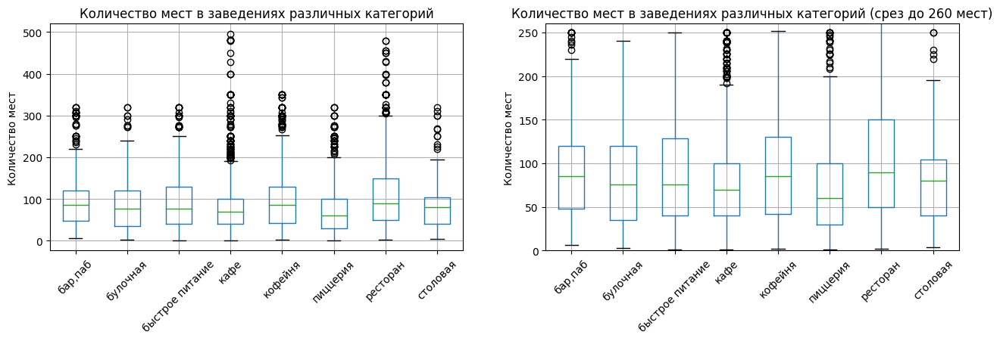

In [40]:
fig, axes = plt.subplots(nrows = 1, ncols = 2, figsize = (15,4))
plt.xticks(rotation=45)

ax = df[df['category'] != 'доставка'].boxplot(column='seats', by='category', ax = axes[0])
axes[0].set_title('Количество мест в заведениях различных категорий')
axes[0].set_ylabel('Количество мест')
axes[0].set_xlabel('')
axes[0].tick_params('x', labelrotation=45)

ax_ylim = df[df['category'] != 'доставка'].boxplot(column='seats', by='category', ax = axes[1])
axes[1].set_title('Количество мест в заведениях различных категорий (срез до 260 мест)')
axes[1].set_ylabel('Количество мест')
axes[1].set_ylim(0, 260)
axes[1].set_xlabel('')
axes[1].tick_params('x', labelrotation=45)

plt.suptitle('')
plt.show()

Согласно диаграмме размаха, более 350 посадочных мест имеют лишь отдельные заведения категорий `кафе` и `ресторан`. Это объясняется тем, что у заведений таких категорий могут присутствовать банкетные залы для проведения массовых мероприятий. 
Наибольший 75% квартиль равный 150 местам имеют заведения категории `ресторан`. Наименьший 75% квартиль равный ~100 местам принадлежит категориям `кафе`, `пиццерия` и `столовая`.  
Наибольший 25% квартиль равный ~50 местам имеют заведения категорий `ресторан`, `бар,паб`. Наименьший 25% квартиль менее 40 мест принадлежит категориям `булочная` и `пиццерия`.

## Соотношение сетевых и несетевых заведений

Рассмотрите и изобразите соотношение сетевых и несетевых заведений в датасете. Каких заведений больше?

In [41]:
len_chain = round(len(df.loc[df['chain'] == 1]) / len(df) * 100)
len_not_chain = round(len(df.loc[df['chain'] == 0])  / len(df) * 100)

colors = ['#636EFA', '#EF553B']

fig = go.Figure(data=[go.Bar(
    x=['Несетевые', 'Сетевые'],
    y=[len_not_chain, len_chain],
    marker_color=colors,
    text=[str(len_not_chain) + '%', str(len_chain) + '%'])],
    layout=go.Layout(height=500, width=900
))

fig.update_layout(title='Соотношение сетевых и несетевых заведений', yaxis_title='Процент')

fig.show()

Несетевых заведений общественного питания в Москве 62%. Сетевые занимают 38% рынка.

In [42]:
categories_chain = df.pivot_table(index='category', columns='chain', aggfunc='count')['name'].sort_values(by=0, ascending=False).reset_index()
categories_chain

chain,category,0,1
0,кафе,1597,779
1,ресторан,1312,657
2,кофейня,693,720
3,"бар,паб",596,168
4,быстрое питание,369,232
5,пиццерия,303,330
6,столовая,227,88
7,булочная,99,157
8,доставка,3,72


In [43]:
x = categories_chain['category']
y_0 = categories_chain[0]
y_1 = categories_chain[1]

fig = go.Figure(data=[go.Bar(name='Несетевые', x=x, y=y_0, text=y_0),
                      go.Bar(name='Сетевые', x=x, y=y_1, text=y_1)],
                layout=go.Layout(height=500, width=900, title='Количество сетевых и несетевых заведений в разбивке по категориям'))

fig.update_layout(legend_title_text = "Тип заведений", yaxis_title='Количество заведений')

fig.update_xaxes(tickangle=315)
fig.show()

`Бары, пабы` в подавляющем большинстве случаев являются несетевыми заведениями с отношением несетевых к сетевым около 4 к 1.  
Категории заведений `кафе`, `рестораны`, `быстрое питание`, `столовые` также в большинстве случаев это несетевые заведения с отношением несетевых к сетевым около 2 к 1.  
`Кофейни` и `пиццерии` имеют паритет в отношении количества сетевых и несетевых заведений.  
Только две категории показали преобладание сетевых заведений — `булочные` и `доставки`.

## Топ-15 популярных сетей в Москве

In [44]:
# Список топ-15 популярных сетей в Москве

top15 = df.loc[df['chain'] == 1]['name'].value_counts().head(15)

In [45]:
fig = px.bar(top15,
             title='Топ-15 популярных сетей в Москве',
             height=600,
             width=900)

fig.update_xaxes(tickangle=315)
fig.update_layout(yaxis_title='Количество заведений',
                  xaxis_title='',
                  showlegend=False)

fig.show()

В топ-15 популярных сетей на первых трёх местах топа расположились кафе и две пиццерии.

In [46]:
# Создание датафрейма df_top15_clear с заведениями из списка топ-15 популярных сетей в Москве

df_top15 = df[df['name'].isin(list(top15.index))]

In [47]:
# Группировка по категориям датафрейма df_top15_clear с заведениями из списка топ-15 популярных сетей в Москве без общих названий заведений

top_15_categories = (df_top15.groupby('category')['name']
                             .agg(['count'])
                             .reset_index()
                             .sort_values(by='count', ascending=False))

add_percent(top_15_categories)

,category,count,percent
5,кофейня,337,40.9%
6,пиццерия,154,18.7%
7,ресторан,117,14.2%
4,кафе,100,12.2%
3,доставка,72,8.7%
1,булочная,25,3.0%
2,быстрое питание,12,1.5%
0,"бар,паб",4,0.5%
8,столовая,2,0.2%


In [48]:
fig = px.bar(top_15_categories,
             x='category',
             y='count',
             title='Распределение топ-15 популярных сетей в Москве',
             labels={'count':'Количество', 'category': ''},
             text="percent",
             height=500,
             width=900)
fig.update_xaxes(tickangle=315)
fig.show()

Топ-15 популярных сетей принадлежат в основном категории `кофейня`.  
Существенные доли также имеют заведения категорий `пиццерия`, `ресторан`, `кафе` и `доставка`.  
Доля заведений категорий `быстрое питание`, `бар,паб`, `столовая` составляет менее 2%.

## Распределение заведений по округам

В датасете представлены все округа Москвы, их список представлен ниже.

In [49]:
df['district'].unique()

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

Сгруппируем данные так, чтобы посчитать количество заведений различных типов в округах Москвы.

In [50]:
# Сгруппируем заведения по округам и категориям

count_by_district = df.pivot_table(index='district', columns='category', aggfunc='count')['name'].reset_index()
count_by_district

category,district,"бар,паб",булочная,быстрое питание,доставка,кафе,кофейня,пиццерия,ресторан,столовая
0,Восточный административный округ,53,25,71,12,272,105,72,148,40
1,Западный административный округ,50,37,62,10,238,150,71,208,24
2,Северный административный округ,68,39,56,6,234,193,77,184,41
3,Северо-Восточный административный округ,62,28,82,7,269,159,68,175,40
4,Северо-Западный административный округ,23,12,30,3,115,62,40,106,18
5,Центральный административный округ,364,50,87,5,464,428,113,665,66
6,Юго-Восточный административный округ,38,13,67,9,282,89,55,136,25
7,Юго-Западный административный округ,38,27,61,11,238,96,64,157,17
8,Южный административный округ,68,25,85,12,264,131,73,190,44


In [51]:
# Новый столбец sum с суммой заведений для сортировки по кол-ву заведений

count_by_district['sum'] = (
    count_by_district['бар,паб'] +
    count_by_district['булочная'] +
    count_by_district['быстрое питание'] +
    count_by_district['доставка'] +
    count_by_district['кафе'] +
    count_by_district['кофейня'] +
    count_by_district['пиццерия'] +
    count_by_district['ресторан'] +
    count_by_district['столовая']
)
count_by_district = count_by_district.sort_values(by='sum', ascending=True)

In [52]:
fig = px.bar(count_by_district,
             x=['бар,паб', 'булочная', 'быстрое питание', 'доставка', 'кафе', 'кофейня', 'пиццерия', 'ресторан', 'столовая'],
             y='district',
             orientation='h',
             color_discrete_sequence=px.colors.qualitative.T10,
             height=650,
             width=1400,
             title='Распределение заведений по округам Москвы')

fig.update_layout(legend_title_text = "Тип заведений",
                  yaxis_title='',
                  xaxis_title='Количество заведений')

fig.show()

В `Центральном административном округе` находится больше всего заведений относительно любого другого округа Москвы. Особенно в `Центральном административном округе` выделяются заведения категория `бар,паб`, подавляющее большинство которых находятся именно в этом округе.  
Остальные округа слабо отличаются друг от друга. За исключением `Северо-Западного округа`, в котором меньше всего заведений. Данный факт скорее всего связан с тем, что в данном округе население меньше всего относительно остальных (за исключением `Центрального округа`).

## Распределение средних рейтингов по категориям заведений

In [53]:
categories_rating = df.groupby('category').agg({'rating': 'mean'}).sort_values(by='rating', ascending=False).reset_index()

In [54]:
fig = make_subplots(
    rows=2, cols=1,
    subplot_titles=('Средний рейтинг по категориям заведений',
                    'Средний рейтинг по категориям заведений (срез от 3.5 до 4.5 баллов)'),
    shared_xaxes=True,
    vertical_spacing=0.23
)

x = categories_rating['category']
y = categories_rating['rating']

fig.add_trace(go.Bar(x=x, y=y,
                    marker=dict(color='#636EFA')),
              1, 1)

fig.add_trace(go.Bar(x=x, y=y,
                  marker=dict(color='#636EFA')),
              2, 1)

fig.update_yaxes(title_text='Рейтинг')

fig.update_layout(height=800,
                  width=800,
                  showlegend=False,
                  xaxis=dict(title=None, showticklabels=True),
                  yaxis2 = dict(range=[3.5, 4.5]))

fig.update_xaxes(tickangle=315)

fig.show()

Усреднённые рейтинги в разных категориях общепита различаются между собой слабо и варьируются от 4.05 до 4.4 баллов, где ~4.4 принадлежит категории `бар, паб` ~4.1 `кафе` и ~4.05 категории `быстрое питание`. Исключением является категория `доставка` со средним рейтингом около 3.8 баллов.

## Cредний рейтинг заведений каждого округа

In [55]:
districts_rating = df.groupby('district').agg({'rating': 'mean'}).sort_values(by='rating', ascending=False).reset_index()

In [56]:
# открываем JSON-файл с границами округов Москвы
with open('admin_level_geomap.geojson', 'r', encoding='utf-8') as f:
        state_geo = json.load(f)

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=districts_rating,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по округам',
).add_to(m)

# выводим карту
m

Наибольший средний рейтинг заведений наблюдается в `Центральном административном округе`. За ним в порядке убывания среднего рейтинга следуют `Северный и Северо-Западный административный округа`. Наименьший показатель демонстрирует `Юго-Восточный административный округ`.

## Заведения на карте Москвы

Посмотрим на все заведения датасета на карте.

In [57]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
df.apply(create_clusters, axis=1)

# выводим карту
m

## Топ-15 улиц по количеству заведений

Построим график распределения заведений на топ-15 улицах по количеству заведений.

In [58]:
# Сгруппируем заведения по улицам и категориям

top_15_street = df.pivot_table(index='street', columns='category', aggfunc='count')['name'].reset_index()
top_15_street = top_15_street.replace(np.nan, 0)

In [59]:
# Новый столбец sum с суммой заведений для сортировки по кол-ву заведений

top_15_street['sum'] = (
    top_15_street['бар,паб'] +
    top_15_street['булочная'] +
    top_15_street['быстрое питание'] +
    top_15_street['доставка'] +
    top_15_street['кафе'] +
    top_15_street['кофейня'] +
    top_15_street['пиццерия'] +
    top_15_street['ресторан'] +
    top_15_street['столовая']
)

top_15_street = top_15_street.sort_values(by='sum', ascending=False).head(15)
top_15_street = top_15_street.sort_values(by='sum', ascending=True)

In [60]:
fig = px.bar(top_15_street,
             x=['бар,паб', 'булочная', 'быстрое питание', 'доставка', 'кафе', 'кофейня', 'пиццерия', 'ресторан', 'столовая'],
             y='street',
             orientation='h',
             color_discrete_sequence=px.colors.qualitative.T10,
             height=650,
             width=1400,
             title='Распределение заведений по топ-15 улиц Москвы')

fig.update_layout(legend_title_text = "Тип заведений",
                  yaxis_title='',
                  xaxis_title='Количество заведений')

fig.show()

Наибольшее количество заведений общественного питания Москвы расположено на `проспекте Мира`. Также более ста заведений расположено на `Профсоюзной улице`, `проспекте Вернадского` и `Ленинском проспекте`.  
Менее 50 заведений расположено на `улицах Миклоха-Маклая` и `Пятницкой`.

## Улицы с одним объектом общепита

In [61]:
# Сгруппируем заведения по улицам и категориям

street_with_one_catering = df.pivot_table(index='street', columns='category', aggfunc='count')['name'].reset_index()
street_with_one_catering = street_with_one_catering.replace(np.nan, 0)

In [62]:
# Новый столбец sum с суммой заведений для сортировки по кол-ву заведений

street_with_one_catering['sum'] = (
    street_with_one_catering['бар,паб'] +
    street_with_one_catering['булочная'] +
    street_with_one_catering['быстрое питание'] +
    street_with_one_catering['доставка'] +
    street_with_one_catering['кафе'] +
    street_with_one_catering['кофейня'] +
    street_with_one_catering['пиццерия'] +
    street_with_one_catering['ресторан'] +
    street_with_one_catering['столовая']
)

street_with_one_catering = street_with_one_catering[street_with_one_catering['sum'] == 1]

Рассмотрим данные заведения на карте.

In [63]:
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# применяем функцию create_clusters() к каждой улице с 1 заведением
df[df['street'].isin(street_with_one_catering['street'])].apply(create_clusters, axis=1)

# выводим карту
m

Как правило, улицы с одним заведением — это небольшие улицы. Среди них также встречаются улицы средних размеров, которые расположены в промышленных зонах.

## Медиана среднего чека заведений каждого округа

In [64]:
districts_avg_bill = df.groupby('district').agg({'middle_avg_bill': 'median'}).reset_index().sort_values(by='middle_avg_bill', ascending=False)
districts_avg_bill['middle_avg_bill'] = districts_avg_bill['middle_avg_bill'].round().astype('int')
districts_avg_bill

,district,middle_avg_bill
1,Западный административный округ,1000
5,Центральный административный округ,1000
4,Северо-Западный административный округ,700
2,Северный административный округ,650
7,Юго-Западный административный округ,600
0,Восточный административный округ,575
3,Северо-Восточный административный округ,500
8,Южный административный округ,500
6,Юго-Восточный административный округ,450


In [65]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=districts_avg_bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медиана среднего чека заведений по округам',
).add_to(m)

# выводим карту
m

Наибольшая величина медианы среднего чека в 1000 рублей наблюдается в `Центральном` и `Западном административных округах`. Это обусловлено повышенной деловой активностью и количеством элитной недвижимости в данных округах.  
Наименьшую величину в 500 и менее рублей демонстрируют `Северо-Восточный`, `Южный` и `Юго-Восточный округа`.

## Вывод

Более 50% заведений общественного питания Москвы являются `кафе` (28.3%) или `рестораном` (24.3%). На третьем по популярности месте стоят `кофейни` с 16.8%. Прочие категории заведений занимают менее 10% рынка, при этом самые редкие категории это `столовая`, `булочная` и `доставка` с 3.7%, 3% и 0.9% соответственно.

Ни одна из категорий не является абсолютным фаворитом или аутсайдером по количеству посадочных мест.  
Наибольшим количеством посадочных мест характеризуются `рестораны`, `кофейни` и `бары ,пабы`.  
Наименьшее количество посадочных мест у `пиццерии`.  
Среди заведений различных категорий наибольший разрыв между средним и медианой по количеству мест показывают `кафе` и `пиццерии`, что говорит о том, что заведения таких категорий чаще являются небольшими заведениями.

Более 350 посадочных мест имеют лишь отдельные заведения категорий `кафе` и `ресторан`. Это объясняется тем, что у заведений таких категорий могут присутствовать банкетные залы для проведения массовых мероприятий. 
Наибольший 75% квартиль равный 150 местам имеют заведения категории `ресторан`. Наименьший 75% квартиль равный ~100 местам принадлежит категориям `кафе`, `пиццерия` и `столовая`.  
Наибольший 25% квартиль равный ~50 местам имеют заведения категорий `ресторан`, `бар,паб`. Наименьший 25% квартиль менее 40 мест принадлежит категориям `булочная` и `пиццерия`.

Несетевых заведений общественного питания в Москве 62%. Сетевые занимают 38% рынка.
`Бары, пабы` в подавляющем большинстве случаев являются несетевыми заведениями с отношением несетевых к сетевым около 4 к 1.  
Категории заведений `кафе`, `рестораны`, `быстрое питание`, `столовые` также в большинстве случаев это несетевые заведения с отношением несетевых к сетевым около 2 к 1.  
`Кофейни` и `пиццерии` имеют паритет в отношении количества сетевых и несетевых заведений.  
Только две категории показали преобладание сетевых заведений — `булочные` и `доставки`.

Топ-15 популярных сетей заведений принадлежат в основном категории `кофейня`.  
Существенные доли также имеют заведения категорий `пиццерия`, `ресторан`, `кафе` и `доставка`.  
Доля заведений категорий `быстрое питание`, `бар,паб`, `столовая` составляет менее 2%.

В `Центральном административном округе` находится больше всего заведений относительно любого другого округа Москвы. Особенно в `Центральном административном округе` выделяются заведения категория `бар,паб`, подавляющее большинство которых находятся именно в этом округе.  
Остальные округа слабо отличаются друг от друга. За исключением `Северо-Западного округа`, в котором меньше всего заведений. Данный факт скорее всего связан с тем, что в данном округе население меньше всего относительно остальных (за исключением `Центрального округа`).

Усреднённые рейтинги в разных категориях общепита различаются между собой слабо и варьируются от 4.05 до 4.4 баллов, где ~4.4 принадлежит категории `бар, паб` ~4.1 `кафе` и ~4.05 категории `быстрое питание`. Исключением является категория `доставка` со средним рейтингом около 3.8 баллов.

Наибольшее количество заведений общественного питания Москвы расположено на `проспекте Мира`. Также более ста заведений расположено на `Профсоюзной улице`, `проспекте Вернадского` и `Ленинском проспекте`.  
Менее 50 заведений расположено на `улицах Миклоха-Маклая` и `Пятницкой`.

Наибольшая величина медианы среднего чека в 1000 рублей наблюдается в `Центральном` и `Западном административных округах`. Это обусловлено повышенной деловой активностью и количеством элитной недвижимости в данных округах.  
Наименьшую величину в 500 и менее рублей демонстрируют `Северо-Восточный`, `Южный` и `Юго-Восточный округа`.

<font size="+4">Часть II. Исследование рынка кофеен Москвы</font><a id='part_II'></a>

# Детализация исследования для открытия кофейни <a id='eda_cafe'></a>

## Количество и расположение кофеен в Москве

In [66]:
df[df['category'] == 'кофейня']['name'].count()

1413

In [67]:
count_coffee_by_district = df.pivot_table(index='district', columns=['category', 'chain'], aggfunc='count')['name']
count_coffee_by_district.columns = [''.join(str(col)).strip() for col in count_coffee_by_district.columns.values]
count_coffee_by_district = count_coffee_by_district.reset_index()[['district', "('кофейня', 0)", "('кофейня', 1)"]]
count_coffee_by_district = count_coffee_by_district.rename(columns={"('кофейня', 0)": 'Несетевые кофейни',
                                                                    "('кофейня', 1)": 'Сетевые кофейни'})
count_coffee_by_district['sum'] = count_coffee_by_district['Несетевые кофейни'] + count_coffee_by_district['Сетевые кофейни']
count_coffee_by_district = count_coffee_by_district.sort_values('sum', ascending=True)

In [68]:
x_0 = count_coffee_by_district['Несетевые кофейни']
x_1 = count_coffee_by_district['Сетевые кофейни']
y = count_coffee_by_district['district']

fig = go.Figure(data=[go.Bar(name='Несетевые', x=x_0, y=y, orientation='h'),
                      go.Bar(name='Сетевые', x=x_1, y=y, orientation='h')],
                layout=go.Layout(height=500, width=900, title='Количество сетевых и несетевых кофеен в округах Москвы'))

fig.update_layout(legend_title_text = "Тип заведений", xaxis_title='Количество заведений', barmode='stack')

fig.show()

Подавляющее число кофеен располагается в `Центральном административном округе` Москвы.  
Рубежа в 150 штук достигают `Северный`, `Северо-Восточный` и `Западный округа`.  
Меньше всего кофеен расположено в `Юго-Западном`, `Юго-Восточном` и `Северо-Западном округах`, в которых насчитывается менее 100 кофеен.

Распределение сетевых и несетевых кофеен приблизительно равное в различных округах. Из общей картины выбиваются `Западный округ`, где преобладают сетевые кофейни и `Юго-Восточный округ`, где больше несетевых.

## Расположение кофеен

Отобразим все кофейни на карте. Сетевым кофейням присвоим красный маркер, несетевым синий.

In [69]:
# на основе функции create_clusters напишем новую, где можно
# указать цвет маркера
def create_colored_clusters(row, color):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
        icon=folium.Icon(color=color)
    ).add_to(marker_cluster)

In [70]:
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# применяем функцию create_colored_clusters с красным цветом для сетевых кофеен
# и с синим цветом для несетевых
df[(df['category'] == 'кофейня') & (df['chain'] == True)].apply(create_colored_clusters, color='red', axis=1)
df[(df['category'] == 'кофейня') & (df['chain'] == False)].apply(create_colored_clusters, color='blue', axis=1)

# выводим карту
m

Анализ расположения кофеен показал, что чаще всего кофейни располагаются:
- в торговых центрах;
- в жилищных комплексах комфорт класса и выше;
- рядом с метро
- рядом с бизнес центрами.

При это в `Центральном округе` кофейни не привязаны к вышеперечисленным локациям, что обусловлено высокой проходимостью и деловой активностью, которые характерны для всего `Центрального округа`.  
Также, сетевые кофейни чаще расположены в торговых центрах по сравнению с несетевыми.

## Круглосуточные кофейни

In [71]:
coffee_24 = df[(df['category'] == 'кофейня') & (df['is_24/7'] == True)]
coffee_24['name'].count()

59

В Москве присутствует 59 круглосуточных кофеен.

In [72]:
count_coffee_24_by_district = coffee_24.groupby('district').agg('count')['name'].sort_values().reset_index()

In [73]:
fig = px.bar(count_coffee_24_by_district,
             x='name',
             y='district',
             orientation='h',
             height=650,
             width=1400,
             title='Распределение круглосуточных кофеен по округам Москвы')

fig.update_layout(yaxis_title='',
                  xaxis_title='Количество круглосуточных кофеен')

fig.show()

`Центральный округ` показывает большой отрыв по количеству круглосуточных кофеен по сравнению с распределением общего числа кофеен по Москве.  
Среди других округов более 5 круглосуточных кофеен присутствует лишь в `Западном` и `Юго-Западном округах`.

## Рейтинги кофеен по округам

In [74]:
df[df['category'] == 'кофейня']['rating'].describe()

count    1413.000000
mean     4.277282   
std      0.372250   
min      1.400000   
25%      4.100000   
50%      4.300000   
75%      4.400000   
max      5.000000   
Name: rating, dtype: float64

Средний и медианный рейтинги кофеен почти равны, что говорит о равномерности распределения оценок пользователей.  
При этом более 75% кофеен имеют рейтинг 4.1 и более баллов.

In [75]:
districts_caffee_rating = df[df['category'] == 'кофейня'].groupby('district').agg({'rating': 'mean'}).sort_values(by='rating').reset_index()

In [76]:
fig = px.bar(districts_caffee_rating,
             x='rating',
             y='district',
             orientation='h',
             height=650,
             width=1400,
             title='Средний рейтинг кофеен по округам (срез от 4.1 до 4.4 баллов)')

fig.update_layout(yaxis_title='',
                  xaxis_title='Рейтинг кофеен',
                  xaxis = dict(range=[4.1, 4.4]))

fig.show()

Разброс в среднем рейтинге между округами присутствует, но не является существенным.  
Отметку в 4.3 балла преодолели два округа — `Центральный` и `Северо-Западный`.  
Наименьший средний рейтинг у кофеен в `Западном округе`, чуть менее 4.2 баллов.

## Стоимость чашки капучино

In [77]:
# Сортируем округа по медиане стоимости чашки капучино в сетевых кофейнях,
# чтобы задать данный порядок при построении графика

sorted_median_chain_coffee_districts = (
    df[df['chain'] == True].groupby('district')
      .agg({'middle_coffee_cup': 'median'})
      .sort_values(by='middle_coffee_cup', ascending=False)
      .reset_index()
)

# Сортируем округа по медиане стоимости чашки капучино в несетевых кофейнях,
# чтобы задать данный порядок при построении графика

sorted_median_nonchain_coffee_districts = (
    df[df['chain'] == False].groupby('district')
      .agg({'middle_coffee_cup': 'median'})
      .sort_values(by='middle_coffee_cup', ascending=False)
      .reset_index()
)

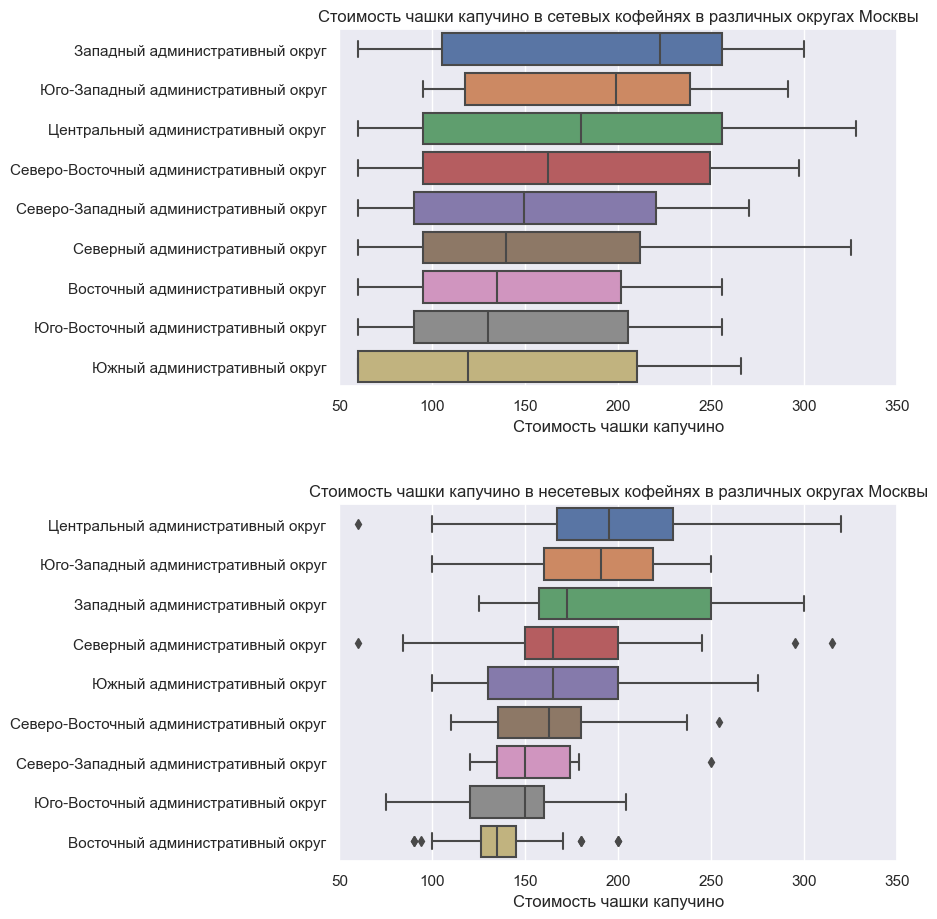

In [78]:
sns.set(style="darkgrid")

fig, axes = plt.subplots(nrows = 2, ncols = 1, figsize = (10,10))

ax_chain = sns.boxplot(x=df[df['chain'] == True]['middle_coffee_cup'], 
                       y=df['district'],
                       order=sorted_median_chain_coffee_districts['district'], ax = axes[0])

axes[0].set_xlim(50,350)
axes[0].set_ylabel('')
axes[0].set_xlabel('Cтоимость чашки капучино')
axes[0].set_title('Cтоимость чашки капучино в сетевых кофейнях в различных округах Москвы')

ax_non_chain = sns.boxplot(x=df[df['chain'] == False]['middle_coffee_cup'], 
                           y=df['district'],
                           order=sorted_median_nonchain_coffee_districts['district'], ax = axes[1])

axes[1].set_xlim(50,350)
axes[1].set_ylabel('')
axes[1].set_xlabel('Cтоимость чашки капучино')
axes[1].set_title('Cтоимость чашки капучино в несетевых кофейнях в различных округах Москвы')

fig.tight_layout(pad=3)
plt.show()

Стоимость чашки капучино имеет зависимость от округа, где расположена кофейня при этом, имеет значение, является кофейня сетевой или нет.  
Наибольшую медианную стоимость за чашку капучино имеют кофейни `Юго-Западного`, `Центрального` и `Западного округов`.  
Наименьшую медианную стоимость за чашку капучино имеют кофейни `Восточного` и `Юго-Восточного округов`.
Отдельно выделяется `Южный округ`. В нём чашка капучино имеет одну из наименьших стоимостей среди сетевых кофеен, однако среди несетевых кофеен данный округ занимает среднюю позицию относительно других округов.

В сетевых заведениях по сравнению с несетевыми стоимость чашки капучино выше в более дорогостоящих округах и ниже в округах с меньший стоимостью.

## Количество посадочных мест

### Среднее количество посадочных мест

In [79]:
mean_seats_coffee_by_district = (
    df.pivot_table(index='district', columns=['category', 'chain'], values='seats', aggfunc='mean')['кофейня']
      .reset_index()
)
mean_seats_coffee_by_district[[0,1]] = mean_seats_coffee_by_district[[0,1]].round()
mean_seats_coffee_by_district['sum'] = mean_seats_coffee_by_district[0] + mean_seats_coffee_by_district[1]
mean_seats_coffee_by_district = mean_seats_coffee_by_district.sort_values('sum', ascending=True)

In [80]:
y = mean_seats_coffee_by_district['district']
x_0 = mean_seats_coffee_by_district[0]
x_1 = mean_seats_coffee_by_district[1]

fig = go.Figure(data=[go.Bar(name='Несетевые', x=x_0, y=y, text=x_0, orientation='h'),
                      go.Bar(name='Сетевые', x=x_1, y=y, text=x_1, orientation='h')],
                layout=go.Layout(height=700, width=1100, title='Среднее количество посадочных мест в кофейнях в различных округах'))

fig.update_layout(legend_title_text = "Тип заведений", xaxis_title='Количество посадочных мест')

fig.show()

Как правило, в сетевых кофейнях больше посадочных мест. Исключения составляют `Южный` и `Северный округа`, где в среднее количество мест немного больше в несетевых кофейнях.

### Медианное количество посадочных мест

In [81]:
median_seats_coffee_by_district = (
    df.pivot_table(index='district', columns=['category', 'chain'], values='seats', aggfunc='median')['кофейня']
      .reset_index()
)
median_seats_coffee_by_district[[0,1]] = median_seats_coffee_by_district[[0,1]].round()
median_seats_coffee_by_district['sum'] = median_seats_coffee_by_district[0] + median_seats_coffee_by_district[1]
median_seats_coffee_by_district = median_seats_coffee_by_district.sort_values('sum', ascending=True)

In [82]:
y = median_seats_coffee_by_district['district']
x_0 = median_seats_coffee_by_district[0]
x_1 = median_seats_coffee_by_district[1]

fig = go.Figure(data=[go.Bar(name='Несетевые', x=x_0, y=y, text=x_0, orientation='h'),
                      go.Bar(name='Сетевые', x=x_1, y=y, text=x_1, orientation='h')],
                layout=go.Layout(height=700, width=1100, title='Медиана количества посадочных мест в кофейнях в различных округах'))

fig.update_layout(legend_title_text = "Тип заведений", xaxis_title='Количество посадочных мест')

fig.show()

Медиана количества посадочных мест в кофейнях по различным округам Москвы также показывает преобладание количества мест в сетевых кофейнях во всех округах. Исключением выступили `Южный округ`, как это было при сравнении среднего количества мест и `Западный округ`, где лидерами с небольшим отрывом выступили несетевые кофейни.  
Наибольшую разницу в количестве посадочных мест между сетевыми и несетевыми кофейнями демонстрируют `Северо-Западный` и `Северо-Восточный округа`, где наблюдается примерно двухкратный отрыв сетевых кофеен.

## Вывод

Подавляющее число кофеен располагается в `Центральном административном округе` Москвы.  
Рубежа в 150 штук достигают `Северный`, `Северо-Восточный` и `Западный округа`.  
Меньше всего кофеен расположено в `Юго-Западном`, `Юго-Восточном` и `Северо-Западном округах`, в которых насчитывается менее 100 кофеен.  
Распределение сетевых и несетевых кофеен приблизительно равное в различных округах. Из общей картины выбиваются `Западный округ`, где преобладают сетевые кофейни и `Юго-Восточный округ`, где больше несетевых.

Анализ расположения кофеен показал, что чаще всего кофейни располагаются:
- в торговых центрах;
- в жилищных комплексах комфорт класса и выше;
- рядом с метро
- рядом с бизнес центрами.

При это в `Центральном округе` кофейни не привязаны к вышеперечисленным локациям, что обусловлено высокой проходимостью и деловой активностью, которые характерны для всего `Центрального округа`.  
Также, сетевые кофейни чаще расположены в торговых центрах по сравнению с несетевыми.

`Центральный округ` показывает большой отрыв по количеству круглосуточных кофеен по сравнению с распределением общего числа кофеен по Москве.  
Среди других округов более 5 круглосуточных кофеен присутствует лишь в `Западном` и `Юго-Западном округах`.

Средний и медианный рейтинги кофеен почти равны, что говорит о равномерности распределения оценок пользователей.  
При этом более 75% кофеен имеют рейтинг 4.1 и более баллов.

Разброс в среднем рейтинге между округами присутствует, но не является существенным.  
Отметку в 4.3 балла преодолели два округа — `Центральный` и `Северо-Западный`.  
Наименьший средний рейтинг у кофеен в `Западном округе`, чуть менее 4.2 баллов.

Стоимость чашки капучино имеет зависимость от округа, где расположена кофейня при этом, имеет значение, является кофейня сетевой или нет.  
Наибольшую медианную стоимость за чашку капучино имеют кофейни `Юго-Западного`, `Центрального` и `Западного округов`.  
Наименьшую медианную стоимость за чашку капучино имеют кофейни `Восточного` и `Юго-Восточного округов`.
Отдельно выделяется `Южный округ`. В нём чашка капучино имеет одну из наименьших стоимостей среди сетевых кофеен, однако среди несетевых кофеен данный округ занимает среднюю позицию относительно других округов.

В сетевых заведениях по сравнению с несетевыми стоимость чашки капучино выше в более дорогостоящих округах и ниже в округах с меньший стоимостью.

Как правило, в сетевых кофейнях больше посадочных мест. Исключения составляют `Южный` и `Северный округа`, где в среднем на несколько мест больше в несетевых кофейнях.

Медиана количества посадочных мест в кофейнях по различным округам Москвы также показывает преобладание количества мест в сетевых кофейнях во всех округах. Исключением выступили `Южный округ`, как это было при сравнении среднего количества мест и `Западный округ`, где лидерами с небольшим отрывом выступили несетевые кофейни.  
Наибольшую разницу в количестве посадочных мест между сетевыми и несетевыми кофейнями демонстрируют `Северо-Западный` и `Северо-Восточный округа`, где наблюдается примерно двухкратный отрыв сетевых кофеен.

# Итоговые выводы исследования <a id='conclusion'></a>

Для инвесторов из фонда «Shut Up and Take My Money» было подготовлено исследование рынка заведений общественного питания Москвы.  
Исследование проводилось на основе датасета, который составлен на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года.

## Выводы по результатам анализа рынка
- Более 50% заведений общественного питания Москвы являются `кафе` (28.3%) или `рестораном` (24.3%). Категории `столовая`, `булочная` и `доставка` занимают 3.7%, 3% и 0.9% соответственно;
- Наибольшим количеством посадочных мест характеризуюся `рестораны`, `кофейни` и `бары ,пабы`. Наименьшее количество посадочных мест у `пиццерии`;
- Более 350 посадочных мест имеют лишь отдельные заведения категорий `кафе` и `ресторан`. Это объясняется тем, что у заведений таких категорий могут присутствовать банкетные залы для проведения массовых мероприятий. Заведения категории `кафе`, `пиццерия` и `столовая` редко имеют более 100 посадочных мест. `Рестораны`, `бары ,пабы` редко имеют менее 50 мест. Менее 40 мест, как правило, имеют лишь `булочные` и `пиццерии`;
- Несетевых заведений общественного питания в Москве 62%. Сетевые занимают 38% рынка. В разрезе категорий:
    - `Бары, пабы` в подавляющем большинстве случаев являются несетевыми заведениями с отношением несетевых к сетевым около 4 к 1;
    - Категории заведений `кафе`, `рестораны`, `быстрое питание`, `столовые` также в большинстве случаев это несетевые заведения с отношением несетевых к сетевым около 2 к 1;
    - `Кофейни` и `пиццерии` имеют паритет в отношении количества сетевых и несетевых заведений;
    - Только две категории показали преобладание сетевых заведений — `булочные` и `доставки`.
- Топ-15 популярных сетей заведений принадлежат в основном категории `кофейня`. Доля заведений категорий `быстрое питание`, `бар,паб`, `столовая` в том же топе составляет менее 2%;
- В `Центральном административном округе` находится больше всего заведений относительно любого другого округа Москвы. Подавляющее большинство заведений категории `бар,паб` находятся именно в этом округе. Меньше всего заведений в `Северо-Западном округе`;
- Усреднённые рейтинги в разных категориях общепита различаются между собой слабо и варьируются от 4.05 до 4.4 баллов, где ~4.4 принадлежит категории `бар, паб` ~4.1 `кафе` и ~4.05 категории `быстрое питание`. Исключением является категория `доставка` со средним рейтингом около 3.8 баллов;
- Среди топ-15 улиц по количеству заведений первое место занимает `проспект Мира`. Замыкают топ-15 `улицы Миклоха-Маклая` и `Пятницкая`;
- Наибольшая величина медианы среднего чека в 1000 рублей наблюдается в `Центральном` и `Западном административных округах`. Наименьшую величину в 500 и менее рублей демонстрируют `Северо-Восточный`, `Южный` и `Юго-Восточный округа`.

## Выводы по результатам детализации исследования для открытия кофейни
- Подавляющее число кофеен располагается в `Центральном административном округе` Москвы. После него располагаются `Северный`, `Северо-Восточный` и `Западный округа`. Меньше всего кофеен расположено в `Юго-Западном`, `Юго-Восточном` и `Северо-Западном округах`, где число кофеен менее 100 штук;
- Распределение сетевых и несетевых кофеен приблизительно равное в различных округах;
- Анализ расположения кофеен показал, что чаще всего кофейни располагаются:
    - в торговых центрах;
    - в жилищных комплексах комфорт класса и выше;
    - рядом с метро
    - рядом с бизнес центрами.
- `Центральный округ` показывает большой отрыв по количеству круглосуточных кофеен по сравнению с распределением общего числа кофеен по Москве.  
- Средний и медианный рейтинги кофеен почти равны, что говорит о равномерности распределения оценок пользователей. Более 75% кофеен имеют рейтинг 4.1 и более баллов.
- Разброс в среднем рейтинге между округами присутствует, но не является существенным;
- Стоимость чашки капучино имеет зависимость от округа, где расположена кофейня при этом, имеет значение, является кофейня сетевой или нет.  
    - Наибольшую медианную стоимость за чашку капучино имеют кофейни `Юго-Западного`, `Центрального` и `Западного округов`.  
    - Наименьшую медианную стоимость за чашку капучино имеют кофейни `Восточного` и `Юго-Восточного округов`.
    - В `Южном округе` чашка капучино имеет одну из наименьших стоимостей среди сетевых кофеен, однако среди несетевых кофеен данный округ занимает среднюю позицию относительно других округов.
    - В сетевых заведениях по сравнению с несетевыми стоимость чашки капучино выше в более дорогостоящих округах и ниже в округах с меньший стоимостью.
- В сетевых кофейнях больше посадочных мест. Исключения составляют `Южный`, `Северный` и `Западный округа`.

## Рекомендации для открытия кофейни
Наиболее перспективные для открытии кофейни округа — `Центральный`, `Западный` и `Юго-Западный округа`. Поскольку данные районы обладают наиболее высокой средней стоимостью за чашку капучино. Также данные районы характеризуются наличием большого количества элитных жилых комплексов и торговых центров, а `Центральный` и `Западный округа` выделяются также высокой деловой активностью.  
Наиболее перспективное расположение кофейни в порядке приоритета:
- рядом с бизнес центрами;
- в жилищных комплексах комфорт класса и выше;
- рядом с метро;
- в торговых центрах.

Такой приоритет обусловлен тем, что в торговых центрах и рядом с метро чаще располагаются сетевые кофейни, а инвесторы пока планируют открыть одну кофейню под своим брендом.

При открытии кофейни в указанных выше округах рекомендуется установить стоимость одной чашки капучино: от 170 до 200 рублей. Такая стоимость близка к медианной в рекомендованных округах.  

Количество посадочных мест в новой кофейне зависит от выбранного инвесторами округа, поскольку разные округа характеризуются различным количеством средних и медианных значений среди расположенных в них кофеен. Рекомендации по числу посадочных мест:
- 55-70 в `Центральном` и `Юго-Западном округах`;
- 95-105 в `Западном округе`.

В случае, если инвесторы планируют открыть круглосуточную кофейню, то следует ориентироваться на `Центральный округ`, поскольку в нём сконцентрирована ночная жизнь города. Также анализ показал, что конкуренты также открывают круглосуточные кофейни в основном в `Центральном округе`, что также косвенно подтверждает перспективность именно этого округа.

<font size="+1">Презентация: https://disk.yandex.ru/i/CNmYuwYTQV6iaw</font>

[К сожержанию](#content)